In [1]:
import os
import time
import string

import numpy as np
import pandas as pd

from datetime import datetime, timedelta
from collections import Counter

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates

from tqdm import tqdm

# Font
from matplotlib import font_manager
try:
    font_path = "/workspace/fonts/"
    font_list = os.listdir(font_path)
    for font_file in font_list:
        font_manager.fontManager.addfont(font_path + font_file)
except:
    raise Exception(f"Cannot Load {font_path+font_file}")


'''
N_ROW = 1
N_COL = 2
X_SIZE = 6
Y_SIZE = 4
DPI = 300
# plt.rcParams['font.family'] = ['NanumSquare', 'Helvetica']
plt.rcParams['font.family'] = ['Helvetica', 'NanumSquare']

fig=plt.figure(figsize = (X_SIZE*N_COL,Y_SIZE*N_ROW), dpi=DPI)
spec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig)#, width_ratios=[1,1,.1], wspace=.3)
axes = []

axi=0
ax = fig.add_subplot(spec[axi//N_COL,axi%N_COL]) # row, col
ax.text(-.05, 1.02, '%s'%(string.ascii_uppercase[axi]), transform=ax.transAxes, size=12, weight='bold')

x.plot('value', cmap='Blues', ax=ax, legend=True)
plt.title('Total Amount of Fundings [KRW]')
plt.text(133.3, 38.7, 'log10', fontsize=8)
plt.ylabel('lat')
plt.xlabel('lon')

axi=1
ax = fig.add_subplot(spec[axi//N_COL,axi%N_COL]) # row, col
ax.text(-.05, 1.02, '%s'%(string.ascii_uppercase[axi]), transform=ax.transAxes, size=12, weight='bold')
plt.plot(10**x.sort_values('value')['value'].values[::-1], 'o-')
plt.ylabel('Total Amount of Fundings [KRW]')
plt.xlabel('Rank of Area')
plt.yscale('log')
'''

"\nN_ROW = 1\nN_COL = 2\nX_SIZE = 6\nY_SIZE = 4\nDPI = 300\n# plt.rcParams['font.family'] = ['NanumSquare', 'Helvetica']\nplt.rcParams['font.family'] = ['Helvetica', 'NanumSquare']\n\nfig=plt.figure(figsize = (X_SIZE*N_COL,Y_SIZE*N_ROW), dpi=DPI)\nspec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig)#, width_ratios=[1,1,.1], wspace=.3)\naxes = []\n\naxi=0\nax = fig.add_subplot(spec[axi//N_COL,axi%N_COL]) # row, col\nax.text(-.05, 1.02, '%s'%(string.ascii_uppercase[axi]), transform=ax.transAxes, size=12, weight='bold')\n\nx.plot('value', cmap='Blues', ax=ax, legend=True)\nplt.title('Total Amount of Fundings [KRW]')\nplt.text(133.3, 38.7, 'log10', fontsize=8)\nplt.ylabel('lat')\nplt.xlabel('lon')\n\naxi=1\nax = fig.add_subplot(spec[axi//N_COL,axi%N_COL]) # row, col\nax.text(-.05, 1.02, '%s'%(string.ascii_uppercase[axi]), transform=ax.transAxes, size=12, weight='bold')\nplt.plot(10**x.sort_values('value')['value'].values[::-1], 'o-')\nplt.ylabel('Total Amount of Fundings [KRW]')\

In [2]:
df = pd.read_parquet('sample.parquet')
df

,date,actor__name,repo__name,org__name,PR_base_user_type,PR_base_stars,PR_base_forks,PR_base_language,PR_base_open_issues
5,2022-01-01 00:00:05+00:00,PlanXCyborg,uc-cdis/cdis-manifest,uc-cdis,Organization,11,13,HTML,162
9,2022-01-01 00:00:07+00:00,btmills,eslint/website,eslint,Organization,85,269,JavaScript,26
10,2022-01-01 00:00:09+00:00,wasteam,microsoft/WebTemplateStudio,microsoft,Organization,1946,203,TypeScript,99
19,2022-01-01 00:00:19+00:00,wasteam,microsoft/WindowsTemplateStudio,microsoft,Organization,2091,409,C#,168
23,2022-01-01 00:00:24+00:00,dependabot[bot],vandmo/dependency-lock-maven-plugin,None,User,22,1,Java,2
...,...,...,...,...,...,...,...,...,...
5751468,2022-01-31 23:21:02+00:00,balloob,home-assistant/core,home-assistant,Organization,49360,16907,Python,1472
5751470,2022-01-31 23:21:02+00:00,Paxilmaniac,Skyrat-SS13/Skyrat-tg,Skyrat-SS13,Organization,49,345,DM,255
5751471,2022-01-31 23:21:02+00:00,neutric,Homebrew/homebrew-cask,Homebrew,Organization,18877,9609,Ruby,47
5751476,2022-01-31 23:21:03+00:00,lenilsonjr,TokelPlatform/tokel_dapp,TokelPlatform,Organization,22,12,TypeScript,49


# Basic Statistics
- # PR Event
- # Authors
    - unique vs cumulative
    - an actor how many act in various repo/org?
    - Inner PR vs Outer PR
    - distribution?
- # Repos
    - onwer-based vs repo-based
- About Stars or Forks
    - Cumulative (default) vs Distinct
- About Open Issues (Not cumulative)
- Language
    - distinct vs non-distinct

In [3]:
tg_orgs = df.org__name.value_counts().iloc[:6].index
df['day'] = df['date'].dt.day
msk = df.org__name.isin(tg_orgs)
data = df[msk].groupby("day")['org__name'].value_counts().unstack()

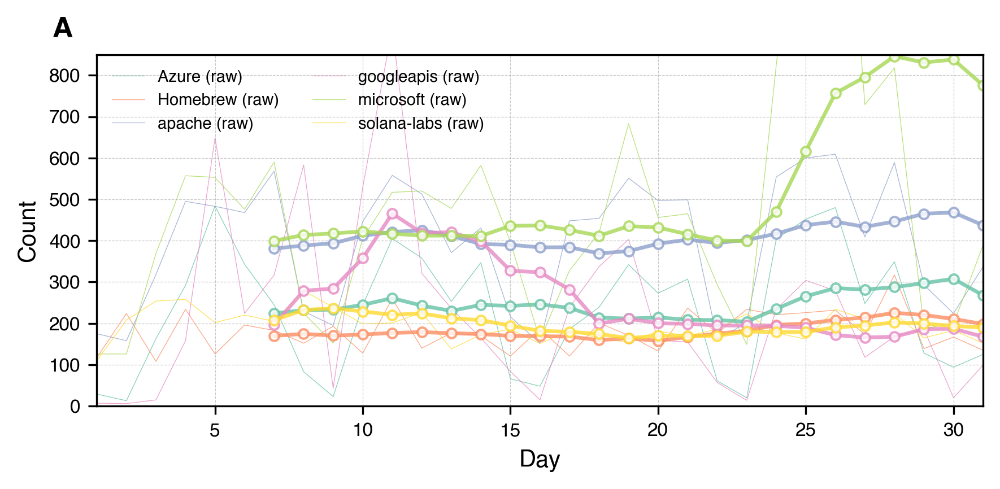

In [4]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import string
import seaborn as sns

# Setup
N_ROW = 1
N_COL = 1
X_SIZE = 6
Y_SIZE = 3
DPI = 300
plt.rcParams['font.family'] = ['Helvetica', 'NanumSquare']

# Create figure
fig = plt.figure(figsize=(X_SIZE * N_COL, Y_SIZE * N_ROW), dpi=DPI)
spec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig)
axi = 0
ax = fig.add_subplot(spec[axi // N_COL, axi % N_COL])

# Subplot label (A, B, C...)
ax.text(-.05, 1.05, f'{string.ascii_uppercase[axi]}', transform=ax.transAxes,
        size=12, weight='bold')

# Prepare color palette
orgs = data.columns
palette = sns.color_palette("Set2", n_colors=len(orgs))
color_map = dict(zip(orgs, palette))

# Plot: Raw data (얇고 투명하게)
for org in orgs:
    ax.plot(data.index, data[org], alpha=.8, linewidth=.3,
            label=f"{org} (raw)", color=color_map[org], zorder=1)

# Plot: Smoothed line (강조된 이동 평균)
data.rolling(7).mean().plot(ax=ax,
                            linewidth=1.6,
                            alpha=.8,
                            color=[color_map[col] for col in data.columns],
                            marker='o', markersize=4, markerfacecolor="white",
                            legend=True,
                            zorder=2)

# Labels & legend
ax.set_xlabel("Day", fontsize=10)
ax.set_ylabel("Count", fontsize=10)

# Grid & axis
ax.grid(True, which='both', linestyle='--', linewidth=0.3, alpha=0.7)
ax.set_xlim(data.index.min(), data.index.max())
ax.tick_params(labelsize=8)

# Legend (평균만 표시할지, 전체 다 표시할지 선택 가능)
handles, labels = ax.get_legend_handles_labels()
custom_labels = [l for l in labels if '(raw)' in l]
ax.legend(handles, custom_labels, fontsize=7, ncol=2, frameon=False, loc='upper left')
plt.ylim([0,850])

plt.tight_layout()
plt.show()


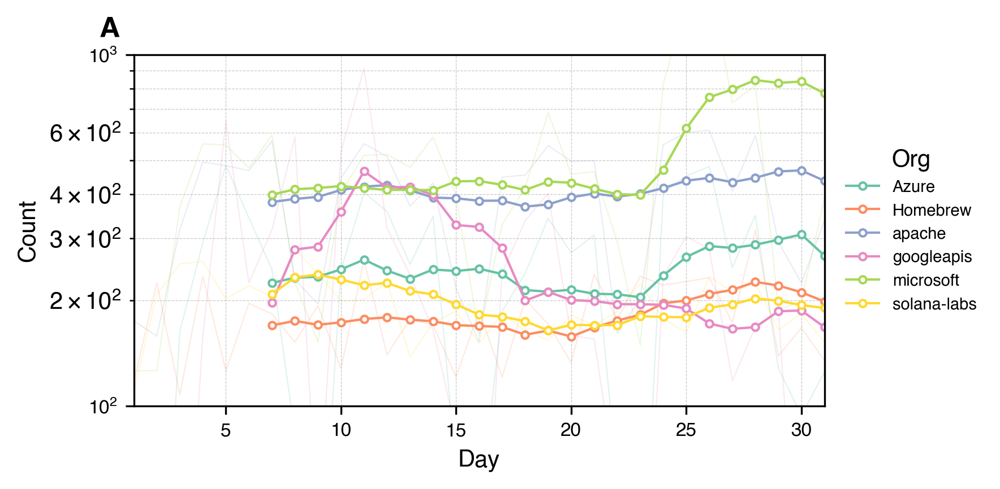

In [5]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import string
import seaborn as sns
from matplotlib.lines import Line2D

# Setup
N_ROW = 1
N_COL = 1
X_SIZE = 6
Y_SIZE = 3
DPI = 300
plt.rcParams['font.family'] = ['Helvetica', 'NanumSquare']

# Create figure
fig = plt.figure(figsize=(X_SIZE * N_COL, Y_SIZE * N_ROW), dpi=DPI)
spec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig)
axi = 0
ax = fig.add_subplot(spec[axi // N_COL, axi % N_COL])

# Subplot label (A, B, C...)
ax.text(-.05, 1.05, f'{string.ascii_uppercase[axi]}', transform=ax.transAxes,
        size=12, weight='bold')

# Prepare color palette
orgs = data.columns
palette = sns.color_palette("Set2", n_colors=len(orgs))
color_map = dict(zip(orgs, palette))

# Plot: Raw data (얇고 투명하게, legend 제외)
for org in orgs:
    ax.plot(data.index, data[org], alpha=0.2, linewidth=.5,
            color=color_map[org], zorder=1)

# Plot: Smoothed line (굵고 마커 있음)
for org in orgs:
    ax.plot(data.index, data[org].rolling(7).mean(),
            linewidth=1,
            alpha=1,
            color=color_map[org],
            label=org,
            marker='o', markerfacecolor="white",
            markersize=3,
            zorder=2)

# Labels
ax.set_xlabel("Day", fontsize=10)
ax.set_ylabel("Count", fontsize=10)

# Grid & ticks
ax.grid(True, which='both', linestyle='--', linewidth=0.3, alpha=0.7)
ax.set_xlim(data.index.min(), data.index.max())
ax.tick_params(labelsize=8)

# Custom legend handles (두껍고 마커 있는 선 만들기)
legend_handles = [
    Line2D([0], [0],
           color=color_map[org],
           lw=1,
           marker='o', markerfacecolor="white",
           markersize=3,
           label=org)
    for org in orgs
]

# Legend outside to the right
ax.legend(handles=legend_handles,
          fontsize=7,
          frameon=False,
          loc='center left',
          bbox_to_anchor=(1.01, 0.5),
          borderaxespad=0.5,
          title='Org')

# plt.ylim([1e2,850])
plt.ylim([1e2,1e3])
plt.yscale("log")

plt.tight_layout()
plt.show()


In [6]:
df_unq = df.drop_duplicates(subset=['repo__name'], keep="last")
df_unq

,date,actor__name,repo__name,org__name,PR_base_user_type,PR_base_stars,PR_base_forks,PR_base_language,PR_base_open_issues,day
60,2022-01-01 00:00:35+00:00,dependabot[bot],vandmo/dependency-lock-maven-plugin,None,User,22,1,Java,6,1
302,2022-01-01 00:01:13+00:00,dependabot[bot],tgymnich/homebridge-vsx,None,User,12,13,JavaScript,13,1
516,2022-01-01 00:01:56+00:00,hunterk,libretro/common-overlays,libretro,Organization,59,54,Shell,9,1
571,2022-01-01 00:02:06+00:00,dependabot[bot],ytausch/serverless-discord-bot,None,User,13,2,JavaScript,3,1
667,2022-01-01 00:02:21+00:00,dependabot[bot],niklasf/chessops,None,User,57,19,TypeScript,6,1
...,...,...,...,...,...,...,...,...,...,...
5751468,2022-01-31 23:21:02+00:00,balloob,home-assistant/core,home-assistant,Organization,49360,16907,Python,1472,31
5751470,2022-01-31 23:21:02+00:00,Paxilmaniac,Skyrat-SS13/Skyrat-tg,Skyrat-SS13,Organization,49,345,DM,255,31
5751471,2022-01-31 23:21:02+00:00,neutric,Homebrew/homebrew-cask,Homebrew,Organization,18877,9609,Ruby,47,31
5751476,2022-01-31 23:21:03+00:00,lenilsonjr,TokelPlatform/tokel_dapp,TokelPlatform,Organization,22,12,TypeScript,49,31


In [7]:
n_contributor = df.groupby("repo__name")['actor__name'].nunique()
n_pr = df.groupby("repo__name")['actor__name'].count()

In [8]:
X = df_unq[['repo__name', 'PR_base_stars', 'PR_base_forks', 'PR_base_open_issues']].set_index('repo__name')
X['Contributor'] = n_contributor
X['PullReq'] = n_pr

In [9]:
Xsub = X[X['PullReq'] > 40]
len(Xsub)

5094

In [10]:
from sklearn.manifold import TSNE

# Step 2: t-SNE 적용
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=250)
tsne_results = tsne.fit_transform(Xsub)

# Step 3: t-SNE 결과를 데이터프레임으로 변환
tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE1', 't-SNE2'])

In [11]:
import umap

reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, n_components=2, random_state=42)
X_embedded = reducer.fit_transform(Xsub)

umap_df = pd.DataFrame(X_embedded)

/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


/tmp/ipykernel_95962/4049829590.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


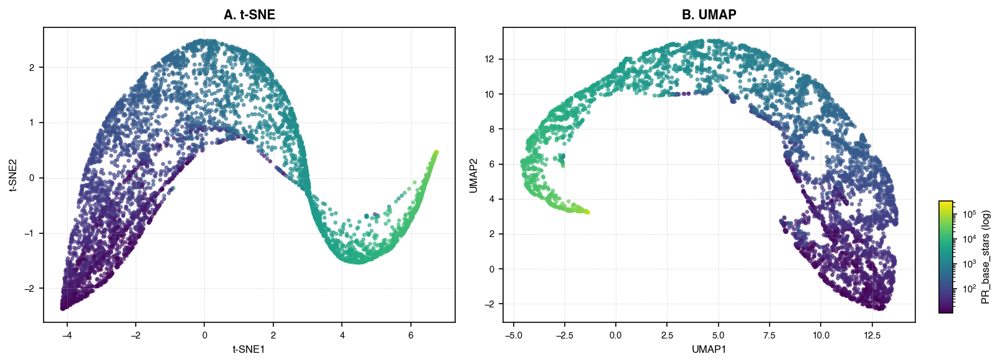

In [13]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# log scale normalization
norm = mcolors.LogNorm(vmin=max(1, Xsub['PR_base_stars'].min()),
                       vmax=Xsub['PR_base_stars'].max())
cmap = cm.viridis

# Plot setup
fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=150)
plt.subplots_adjust(wspace=0.3)

# Plot A: t-SNE
sc1 = axes[0].scatter(tsne_df['t-SNE1'], tsne_df['t-SNE2'],
                      c=Xsub['PR_base_stars'], cmap=cmap, norm=norm,
                      s=5, alpha=0.6)
axes[0].set_title("A. t-SNE", fontsize=10, weight='bold')
axes[0].set_xlabel("t-SNE1", fontsize=8)
axes[0].set_ylabel("t-SNE2", fontsize=8)

# Plot B: UMAP
sc2 = axes[1].scatter(umap_df[0], umap_df[1],
                      c=Xsub['PR_base_stars'], cmap=cmap, norm=norm,
                      s=5, alpha=0.6)
axes[1].set_title("B. UMAP", fontsize=10, weight='bold')
axes[1].set_xlabel("UMAP1", fontsize=8)
axes[1].set_ylabel("UMAP2", fontsize=8)

# Custom colorbar position (오른쪽 아래에 작게)
# [left, bottom, width, height] in figure coordinates (0~1)
cbar_ax = fig.add_axes([1.01, 0.15, 0.015, 0.3])  # 위치 조정 가능
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap),
                    cax=cbar_ax)
cbar.set_label("PR_base_stars (log)", fontsize=8)
cbar.ax.tick_params(labelsize=7)

# 기타 설정
for ax in axes:
    ax.tick_params(labelsize=7)
    ax.grid(True, linestyle='--', linewidth=0.3, alpha=0.6)

plt.tight_layout()
plt.show()


/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


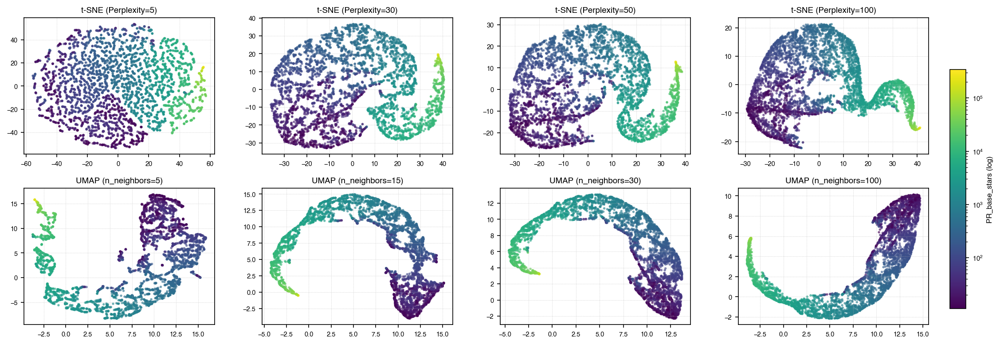

In [14]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import pandas as pd
from sklearn.manifold import TSNE
import umap

# DataSet
Xsub = X[X['PullReq'] > 40]

# 파라미터 단계 설정
perplexities = [5, 30, 50, 100]
n_neighbors_list = [5, 15, 30, 100]

# 정규화된 컬러맵 (log scale)
norm = mcolors.LogNorm(vmin=max(1, Xsub['PR_base_stars'].min()),
                       vmax=Xsub['PR_base_stars'].max())
cmap = cm.viridis

# Plot 설정
fig, axes = plt.subplots(2, 4, figsize=(16, 6), dpi=150)
plt.subplots_adjust(left=0.05, right=0.9, wspace=0.25, hspace=0.25)

# ---------- t-SNE ----------
for i, perp in enumerate(perplexities):
    tsne = TSNE(n_components=2, random_state=42, perplexity=perp, max_iter=500)
    tsne_result = tsne.fit_transform(Xsub)
    tsne_df = pd.DataFrame(tsne_result, columns=['x', 'y'])

    axes[0, i].scatter(tsne_df['x'], tsne_df['y'],
                       c=Xsub['PR_base_stars'], cmap=cmap, norm=norm,
                       s=3, alpha=0.5)
    axes[0, i].set_title(f't-SNE (Perplexity={perp})', fontsize=9)
    axes[0, i].tick_params(labelsize=7)
    axes[0, i].grid(True, linestyle='--', linewidth=0.3, alpha=0.6)

# ---------- UMAP ----------
for i, nn in enumerate(n_neighbors_list):
    reducer = umap.UMAP(n_neighbors=nn, min_dist=0.1, n_components=2, random_state=42)
    umap_result = reducer.fit_transform(Xsub)
    umap_df = pd.DataFrame(umap_result, columns=['x', 'y'])

    axes[1, i].scatter(umap_df['x'], umap_df['y'],
                       c=Xsub['PR_base_stars'], cmap=cmap, norm=norm,
                       s=3, alpha=0.5)
    axes[1, i].set_title(f'UMAP (n_neighbors={nn})', fontsize=9)
    axes[1, i].tick_params(labelsize=7)
    axes[1, i].grid(True, linestyle='--', linewidth=0.3, alpha=0.6)

# ---------- 컬러바 (오른쪽 아래) ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.6])  # 오른쪽 아래 조정
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap),
                    cax=cbar_ax)
cbar.set_label("PR_base_stars (log)", fontsize=8)
cbar.ax.tick_params(labelsize=7)

plt.show()


In [15]:
from sklearn.preprocessing import StandardScaler
import numpy as np

# Step 1: 로그 변환 (log1p: 0도 처리 가능)
X_log = np.log1p(Xsub)

# Step 2: 표준화 (평균 0, 표준편차 1)
X_scaled = StandardScaler().fit_transform(X_log)

In [16]:
from sklearn.manifold import TSNE
import umap
from collections import defaultdict
from tqdm import tqdm
import pandas as pd

# 로그 변환 + 스케일링 추천 (이전 설명 참고)
from sklearn.preprocessing import StandardScaler
import numpy as np

Xsub = X[X['PullReq'] > 40]
X_log = np.log1p(Xsub+1)
X_scaled = StandardScaler().fit_transform(X_log)

# 파라미터 설정
perplexities = [5, 30, 50, 100]
n_neighbors_list = [5, 15, 30, 100]

# 결과 저장용
dfs = defaultdict(list)

# 진행 상황 출력
for perp, nn in tqdm(zip(perplexities, n_neighbors_list), total=len(perplexities), desc="t-SNE & UMAP 진행 중"):

    # t-SNE
    tsne = TSNE(n_components=2, random_state=42, perplexity=perp, n_iter=500, init='pca')
    tsne_result = tsne.fit_transform(X_scaled)
    tsne_df = pd.DataFrame(tsne_result, columns=['x', 'y'])
    tsne_df['method'] = f'tSNE_p{perp}'
    dfs['tsne'].append(tsne_df)

    # UMAP
    reducer = umap.UMAP(n_neighbors=nn, min_dist=0.1, n_components=2, random_state=42)
    umap_result = reducer.fit_transform(X_scaled)
    umap_df = pd.DataFrame(umap_result, columns=['x', 'y'])
    umap_df['method'] = f'UMAP_n{nn}'
    dfs['umap'].append(umap_df)

t-SNE & UMAP 진행 중:   0%|                                          | 0/4 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
t-SNE & UMAP 진행 중:  25%|████████▌                         | 1/4 [00:04<00:12,  4.07s/it]/opt/conda/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
t-SNE & UMAP 진행 중:  50%|█████████████████                 | 2/4 [00:12<00:13,  6.71s/it]/opt/conda/lib/python3.10/site-package

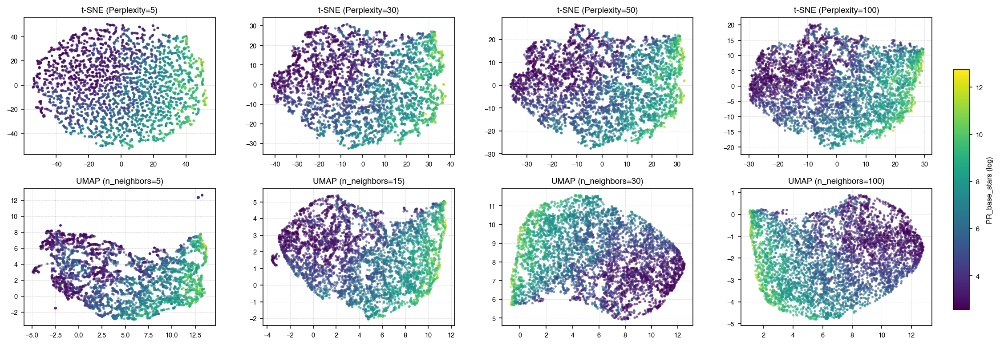

In [17]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import pandas as pd
from sklearn.manifold import TSNE
import umap

# DataSet
Xsub = X[X['PullReq'] > 40]
cbar = X_log['PR_base_stars']

# 파라미터 단계 설정
perplexities = [5, 30, 50, 100]
n_neighbors_list = [5, 15, 30, 100]

# 정규화된 컬러맵 (Norm)
# norm = mcolors.LogNorm(vmin=max(1, cbar.min()),
#                        vmax=cbar.max())
norm = mcolors.Normalize(vmin=max(1, cbar.min()),
                       vmax=cbar.max())

cmap = cm.viridis

# Plot 설정
fig, axes = plt.subplots(2, 4, figsize=(16, 6), dpi=150)
plt.subplots_adjust(left=0.05, right=0.9, wspace=0.25, hspace=0.25)

# ---------- t-SNE ----------
for i, perp in enumerate(perplexities):
    tsne_df = dfs['tsne'][i]

    axes[0, i].scatter(tsne_df['x'], tsne_df['y'],
                       c=cbar, cmap=cmap, norm=norm,
                       s=3, alpha=0.5)
    axes[0, i].set_title(f't-SNE (Perplexity={perp})', fontsize=9)
    axes[0, i].tick_params(labelsize=7)
    axes[0, i].grid(True, linestyle='--', linewidth=0.3, alpha=0.6)

# ---------- UMAP ----------
for i, nn in enumerate(n_neighbors_list):
    umap_df = dfs['umap'][i]

    axes[1, i].scatter(umap_df['x'], umap_df['y'],
                       c=cbar, cmap=cmap, norm=norm,
                       s=3, alpha=0.5)
    axes[1, i].set_title(f'UMAP (n_neighbors={nn})', fontsize=9)
    axes[1, i].tick_params(labelsize=7)
    axes[1, i].grid(True, linestyle='--', linewidth=0.3, alpha=0.6)

# ---------- 컬러바 (오른쪽 아래) ----------
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.6])  # 오른쪽 아래 조정
cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap),
                    cax=cbar_ax)
cbar.set_label("PR_base_stars (log)", fontsize=8)
cbar.ax.tick_params(labelsize=7)

plt.show()


### Scaling은 언제나 정답일 수는 없다.

In [18]:
perp = 42

tsne = TSNE(n_components=2, random_state=42, perplexity=perp, max_iter=500, init='pca')
tsne_result = tsne.fit_transform(Xsub)
tsne_df = pd.DataFrame(tsne_result, columns=['x', 'y'])

In [19]:
from scipy.cluster.hierarchy import linkage, fcluster

# Agglomerative 클러스터링: Linkage Matrix 생성
linkage_matrix = linkage(Xsub, method='ward')
linkage_matrix_scaled = linkage(X_scaled, method='ward')

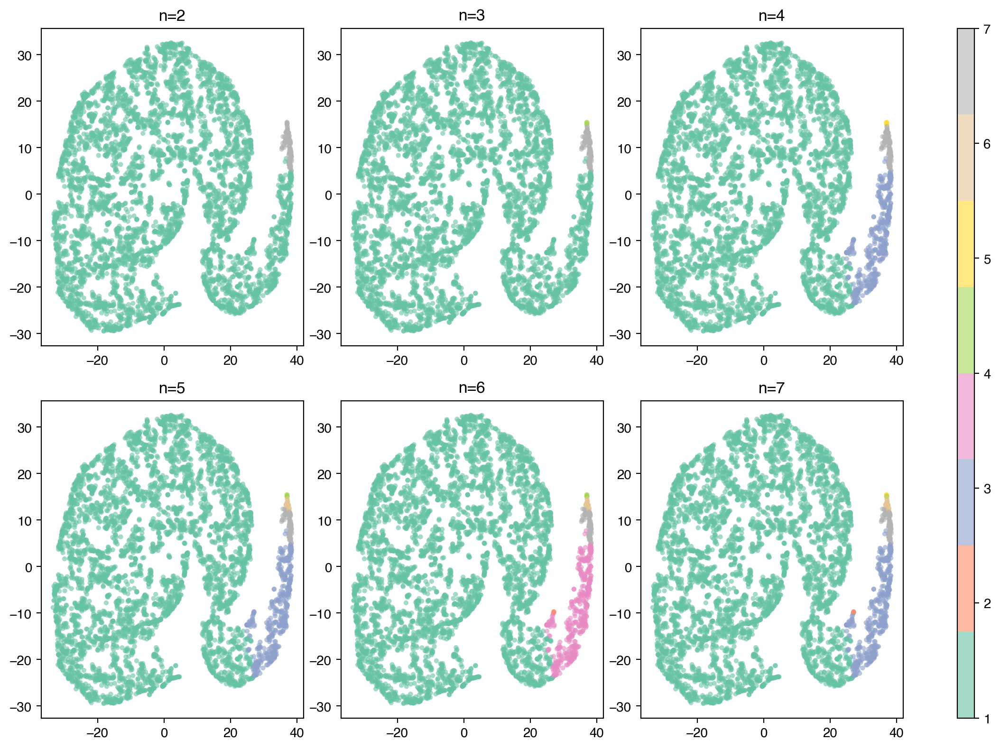

In [20]:
# 다양한 n_clusters 적용
n_clusters_list = [2, 3, 4, 5, 6, 7]
cluster_results = {}

fig, axes = plt.subplots(2, 3, figsize=(12, 8), dpi=200)
axes = axes.flatten()
for axi, n_clusters in enumerate(n_clusters_list):
    # 클러스터 할당
    labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')
    cluster_results[n_clusters] = labels

    ax = axes[axi]
    scatter = ax.scatter(tsne_df['x'], tsne_df['y'], c=labels, cmap='Set2', s=14, alpha=0.6, edgecolor="none")
    ax.set_title(f"n={n_clusters}")

plt.tight_layout()
plt.colorbar(scatter, ax=axes, location='right', aspect=40)
plt.show()

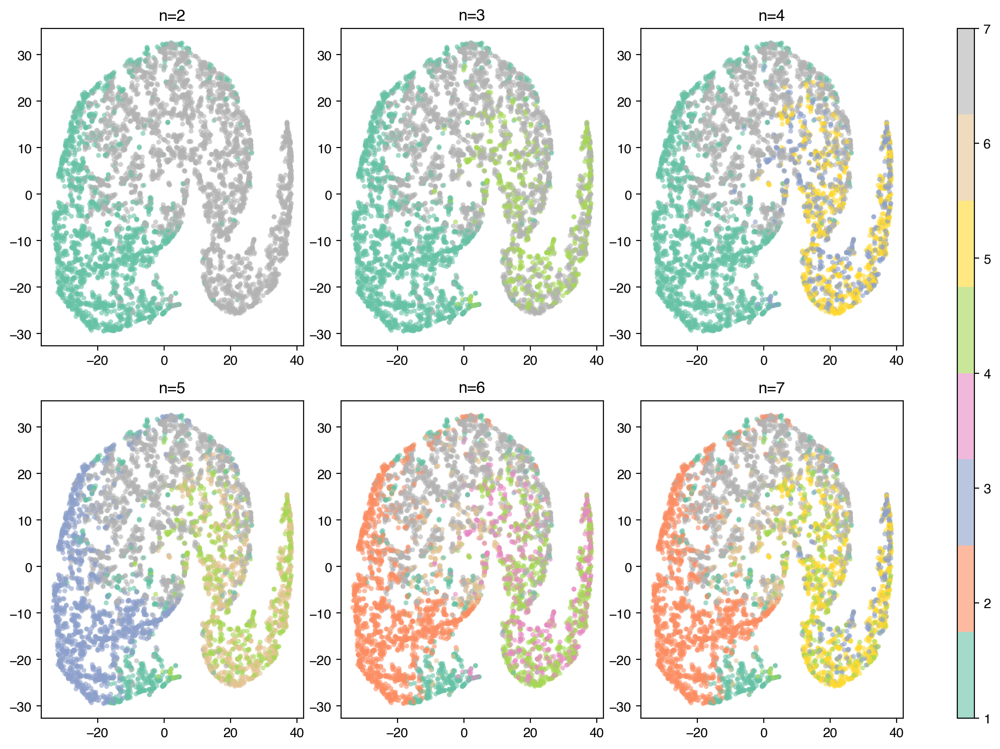

In [21]:
# 다양한 n_clusters 적용
n_clusters_list = [2, 3, 4, 5, 6, 7]
cluster_results = {}

fig, axes = plt.subplots(2, 3, figsize=(12, 8), dpi=200)
axes = axes.flatten()
for axi, n_clusters in enumerate(n_clusters_list):
    # 클러스터 할당
    labels = fcluster(linkage_matrix_scaled, t=n_clusters, criterion='maxclust')
    cluster_results[n_clusters] = labels

    ax = axes[axi]
    scatter = ax.scatter(tsne_df['x'], tsne_df['y'], c=labels, cmap='Set2', s=14, alpha=0.6, edgecolor="none")
    ax.set_title(f"n={n_clusters}")

plt.tight_layout()
plt.colorbar(scatter, ax=axes, location='right', aspect=40)
plt.show()

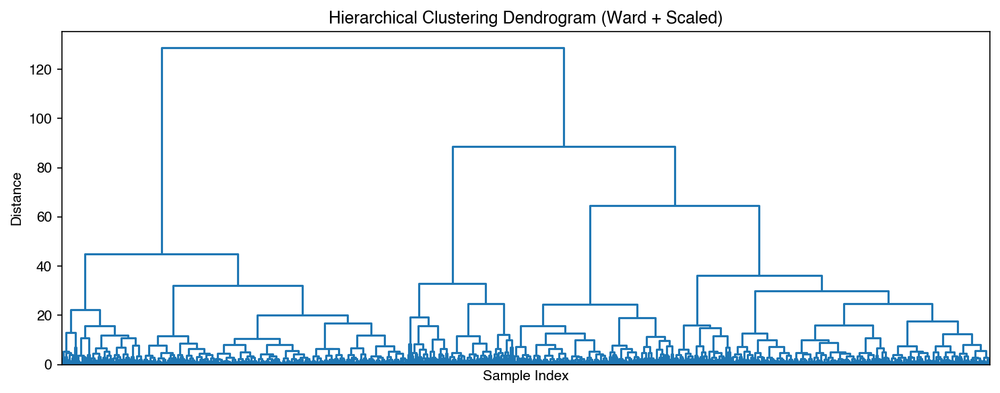

In [22]:
from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4), dpi=150)
dendrogram(linkage_matrix_scaled, no_labels=True, color_threshold=0, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering Dendrogram (Ward + Scaled)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()


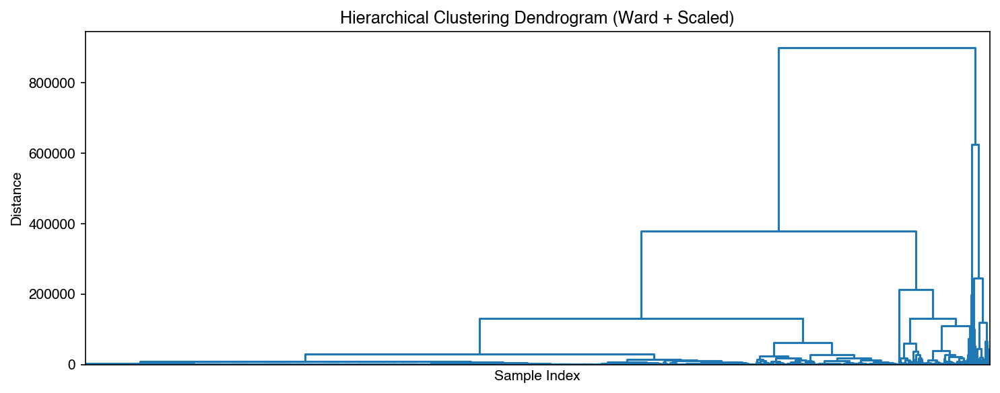

In [23]:
from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4), dpi=150)
dendrogram(linkage_matrix, no_labels=True, color_threshold=0, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering Dendrogram (Ward + Scaled)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()


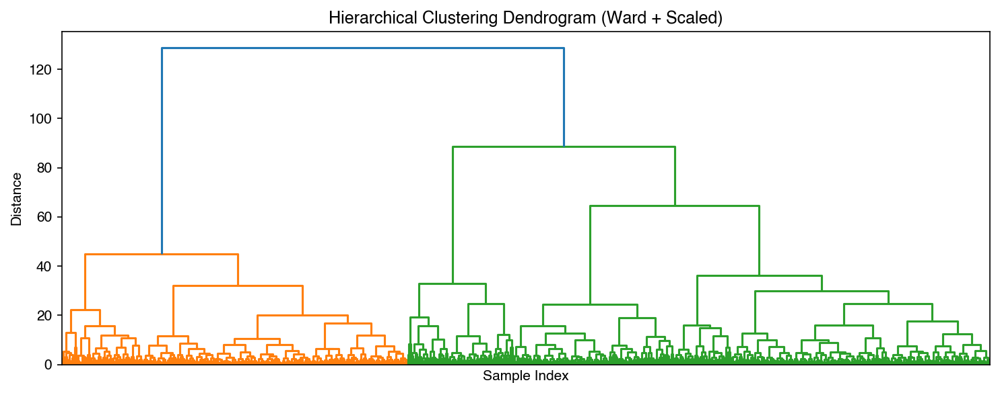

In [24]:
# dendrogram(linkage_matrix_scaled, color_threshold=60)
# plt.axhline(y=60, c='red', ls='--', lw=1)


from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4), dpi=150)
dendrogram(linkage_matrix_scaled, no_labels=True, color_threshold=100, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering Dendrogram (Ward + Scaled)")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.tight_layout()
plt.show()


In [25]:
from scipy.cluster.hierarchy import fcluster

# 예: 거리 기준으로 클러스터 자르기
labels = fcluster(linkage_matrix_scaled, t=80, criterion='distance')

# 또는 클러스터 개수 지정 (예: k=5)
labels_k = fcluster(linkage_matrix_scaled, t=5, criterion='maxclust')

<Axes: xlabel='x', ylabel='y'>

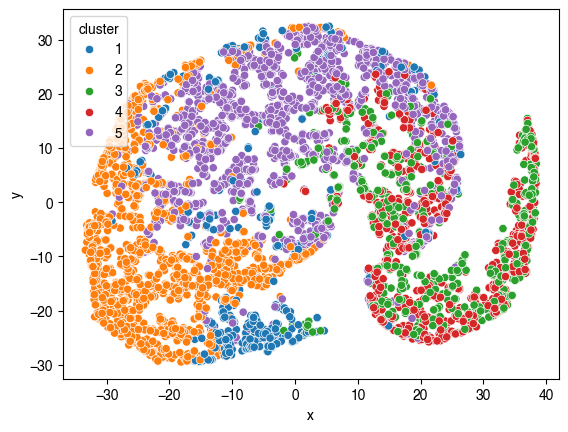

In [26]:
tsne_df['cluster'] = labels_k
sns.scatterplot(data=tsne_df, x='x', y='y', hue='cluster', palette='tab10')

In [27]:
Xsub.columns

Index(['PR_base_stars', 'PR_base_forks', 'PR_base_open_issues', 'Contributor',
       'PullReq'],
      dtype='object')

In [28]:
Xsub

,PR_base_stars,PR_base_forks,PR_base_open_issues,Contributor,PullReq
repo__name,,,,,
opendistro-for-elasticsearch/data-prepper,39,19,96,1,72
fremantle-industries/slurpee,14,1,0,2,46
Nike-Inc/cerberus,53,23,43,1,43
ergebnis/test-util,15,2,0,3,44
amandakelake/blog,1902,144,86,1,50
...,...,...,...,...,...
activemerchant/active_merchant,4393,2491,203,22,73
home-assistant/core,49360,16907,1472,186,1855
Skyrat-SS13/Skyrat-tg,49,345,255,54,964


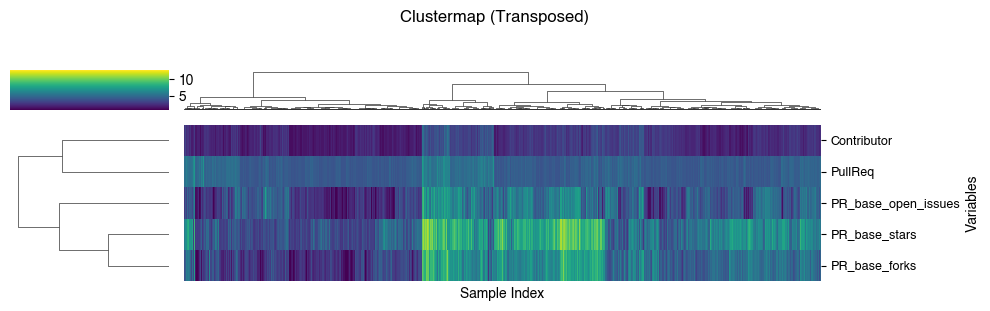

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
import pandas as pd

# 1. 전치된 데이터: 변수 기준 행, 샘플 기준 열
X_df_T = pd.DataFrame(X_scaled.T, index=Xsub.columns)

# 2. linkage 계산 (주의: 행/열 바뀌었으니 뒤집어서)
row_linkage = linkage(X_df_T, method='ward')           # 변수 간 유사도
col_linkage = linkage(X_scaled, method='ward')         # 샘플 간 유사도

# 3. clustermap 그리기
g = sns.clustermap(
    X_log.T,
    row_linkage=row_linkage,
    col_linkage=col_linkage,
    cmap='viridis',
    figsize=(10, 3),
    xticklabels=False,
    yticklabels=True
)

# 4. 레이블 회전 등 시각적 조정
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=9)
g.ax_heatmap.set_xlabel("Sample Index")
g.ax_heatmap.set_ylabel("Variables")

plt.suptitle("Clustermap (Transposed)", y=1.02)
plt.tight_layout()
plt.show()


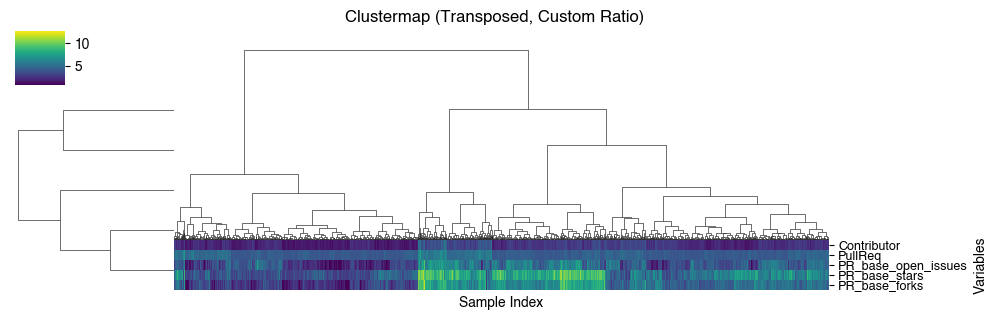

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
import pandas as pd

# 전치된 데이터
X_df_T = pd.DataFrame(X_scaled.T, index=Xsub.columns)

# linkage 계산
row_linkage = linkage(X_df_T, method='ward')
col_linkage = linkage(X_scaled, method='ward')

# clustermap 생성
g = sns.clustermap(
    X_log.T,
    row_linkage=row_linkage,
    col_linkage=col_linkage,
    cmap='viridis',
    figsize=(10, 3),
    xticklabels=False,
    yticklabels=True
)

# === 축 비율 조정: col_dendrogram 높게 / heatmap 낮게 ===

# get bounding boxes
col_dendro_box = g.ax_col_dendrogram.get_position()
heatmap_box = g.ax_heatmap.get_position()

# 재배치 (높이를 8:2 비율로 설정)
top = col_dendro_box.y1
bottom = heatmap_box.y0
total_height = top - bottom

col_height = total_height * 0.8
heatmap_height = total_height * 0.2

# col dendrogram 위치 수정
g.ax_col_dendrogram.set_position([
    col_dendro_box.x0,
    bottom + heatmap_height,
    col_dendro_box.width,
    col_height
])

# heatmap 위치 수정
g.ax_heatmap.set_position([
    heatmap_box.x0,
    bottom,
    heatmap_box.width,
    heatmap_height
])

# 라벨 조정
g.ax_heatmap.set_xlabel("Sample Index")
g.ax_heatmap.set_ylabel("Variables")
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=9)

# 타이틀
plt.suptitle("Clustermap (Transposed, Custom Ratio)", y=1.05)
plt.show()


<Figure size 1920x1440 with 0 Axes>

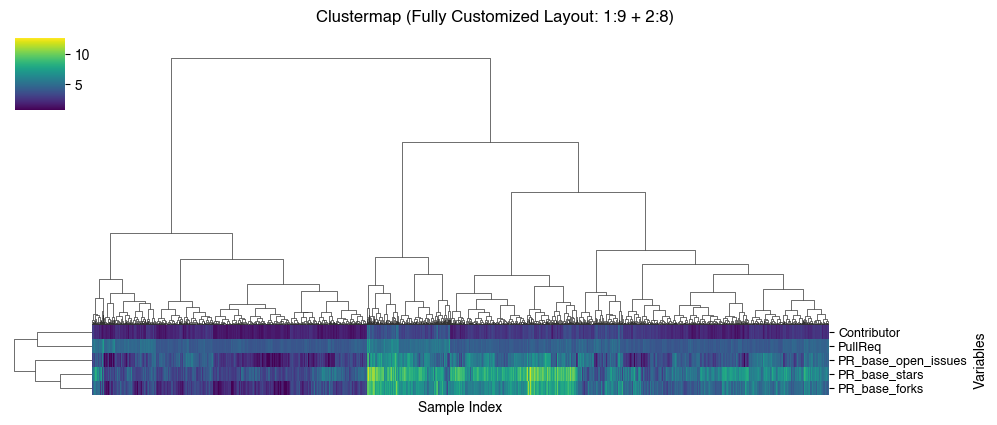

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage
import pandas as pd

# 전치된 데이터
X_df_T = pd.DataFrame(X_scaled.T, index=Xsub.columns)
row_linkage = linkage(X_df_T, method='ward')
col_linkage = linkage(X_scaled, method='ward')

# clustermap 생성
plt.figure(dpi=300)
g = sns.clustermap(
    X_log.T,
    row_linkage=row_linkage,
    col_linkage=col_linkage,
    cmap='viridis',
    figsize=(10, 4),
    xticklabels=False,
    yticklabels=True
)

# ====== 위치 가져오기 ======
col_dendro_box = g.ax_col_dendrogram.get_position()
row_dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box     = g.ax_heatmap.get_position()

# 전체 영역 계산
left   = row_dendro_box.x0
right  = heatmap_box.x1
bottom = heatmap_box.y0
top    = col_dendro_box.y1

# 가로 전체 넓이 / 세로 전체 높이
total_width  = right - left
total_height = top - bottom

# 비율 계산
col_height = total_height * 0.8
heatmap_height = total_height * 0.2

row_width = total_width * 0.1
heatmap_width = total_width * 0.9

# ====== 위치 재조정 ======

# 상단 col_dendrogram 위치
g.ax_col_dendrogram.set_position([
    left + row_width,
    bottom + heatmap_height,
    heatmap_width,
    col_height
])

# 왼쪽 row_dendrogram 위치
g.ax_row_dendrogram.set_position([
    left,
    bottom,
    row_width,
    heatmap_height
])

# 히트맵 위치
g.ax_heatmap.set_position([
    left + row_width,
    bottom,
    heatmap_width,
    heatmap_height
])

# ====== 기타 설정 ======
g.ax_heatmap.set_xlabel("Sample Index")
g.ax_heatmap.set_ylabel("Variables")
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=9)

plt.suptitle("Clustermap (Fully Customized Layout: 1:9 + 2:8)", y=1.05)
plt.show()


In [32]:
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.spatial.distance import pdist
import numpy as np

# 1. linkage matrix 생성
Z = linkage(X_scaled, method='ward')  # 변수 간 linkage

# 2. 기본 leaf 순서 (맨 위 분기 기준으로)
default_order = leaves_list(Z)

# 3. 첫 분기만 좌우 바꾸기
# - linkage matrix에서 마지막 행 (root 노드)를 가져옴
# - 이건 두 클러스터를 합친 정보
left, right = int(Z[-1, 0]), int(Z[-1, 1])

# 4. subtree의 leaf 리스트 가져오기
def get_leaves(Z, node_id):
    if node_id < len(X_scaled):  # leaf node
        return [node_id]
    else:
        left = int(Z[node_id - len(X_scaled), 0])
        right = int(Z[node_id - len(X_scaled), 1])
        return get_leaves(Z, left) + get_leaves(Z, right)

# 5. 좌우 순서를 바꾼 leaf 순서 생성
left_leaves = get_leaves(Z, right)  # intentionally swapped
right_leaves = get_leaves(Z, left)
custom_order = left_leaves + right_leaves

/opt/conda/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 1920x1440 with 0 Axes>

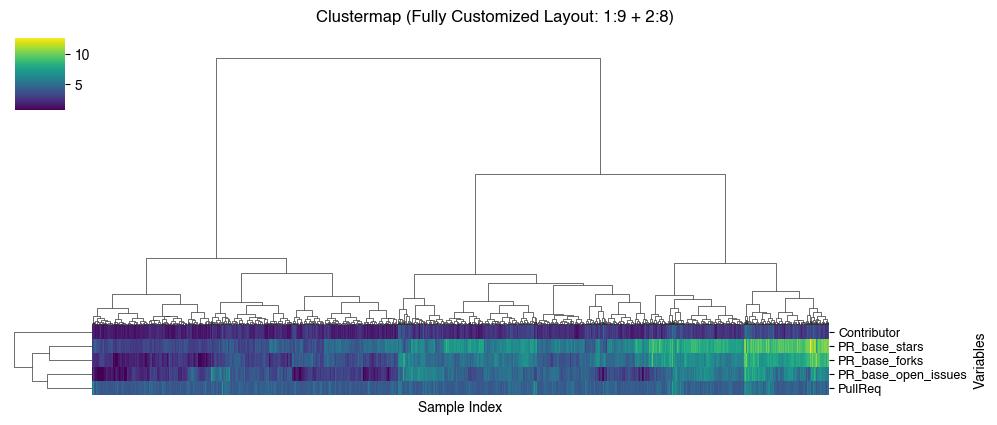

In [33]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage

# 전치된 데이터
# row_linkage = linkage(X_df_T, method='ward')
col_linkage = linkage(X_log.iloc[custom_order], method='ward')

# clustermap 생성
plt.figure(dpi=300)
g = sns.clustermap(
    X_log.iloc[custom_order].T,  # leaf 순서 강제 적용!
    col_linkage=col_linkage,
    cmap='viridis',
    figsize=(10, 4),
    xticklabels=False,
    yticklabels=True
)

# ====== 위치 가져오기 ======
col_dendro_box = g.ax_col_dendrogram.get_position()
row_dendro_box = g.ax_row_dendrogram.get_position()
heatmap_box     = g.ax_heatmap.get_position()

# 전체 영역 계산
left   = row_dendro_box.x0
right  = heatmap_box.x1
bottom = heatmap_box.y0
top    = col_dendro_box.y1

# 가로 전체 넓이 / 세로 전체 높이
total_width  = right - left
total_height = top - bottom

# 비율 계산
col_height = total_height * 0.8
heatmap_height = total_height * 0.2

row_width = total_width * 0.1
heatmap_width = total_width * 0.9

# ====== 위치 재조정 ======

# 상단 col_dendrogram 위치
g.ax_col_dendrogram.set_position([
    left + row_width,
    bottom + heatmap_height,
    heatmap_width,
    col_height
])

# 왼쪽 row_dendrogram 위치
g.ax_row_dendrogram.set_position([
    left,
    bottom,
    row_width,
    heatmap_height
])

# 히트맵 위치
g.ax_heatmap.set_position([
    left + row_width,
    bottom,
    heatmap_width,
    heatmap_height
])

# ====== 기타 설정 ======
g.ax_heatmap.set_xlabel("Sample Index")
g.ax_heatmap.set_ylabel("Variables")
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=9)

plt.suptitle("Clustermap (Fully Customized Layout: 1:9 + 2:8)", y=1.05)
plt.show()


/tmp/ipykernel_95962/1022681725.py:102: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


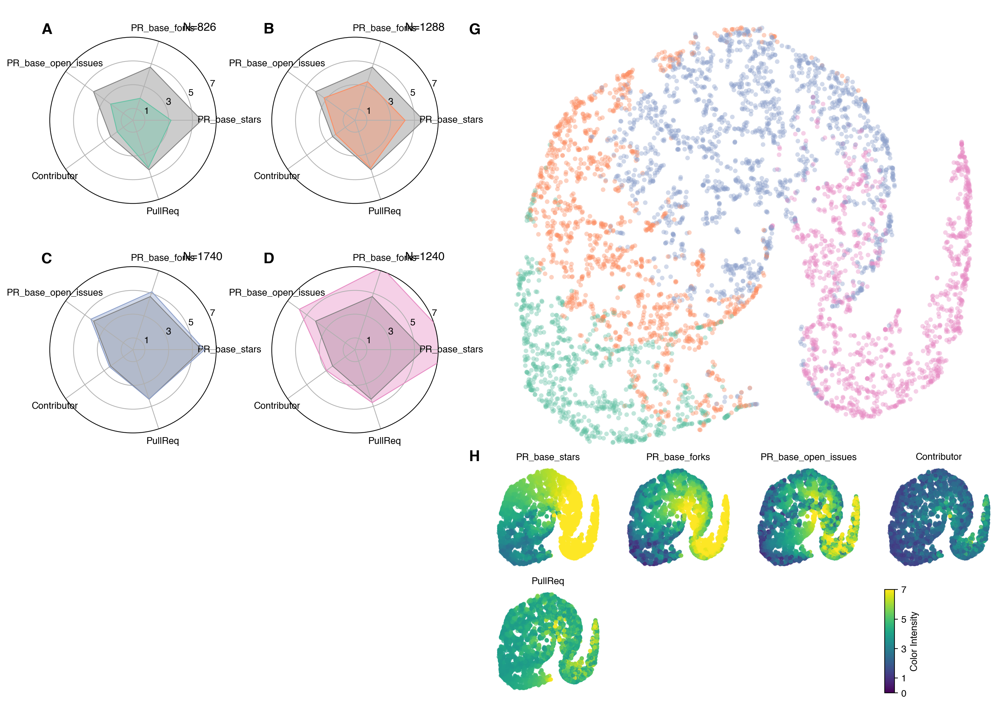

In [34]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
import seaborn as sns
import pandas as pd
import numpy as np
import string
from scipy.cluster.hierarchy import linkage, fcluster

# --------- 데이터 (X_log, tsne_df, cols) 사전 정의 필요 ---------
# X_log: log 변환된 데이터프레임
# tsne_df: t-SNE 2D 결과 (DataFrame)
# cols: 분석 대상 변수명 리스트

# 클러스터링
linkage_matrix = linkage(X_log, method='ward')
n_clusters = 4
labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')
cols = X_log.columns

X_log_with_cluster = X_log.copy()
X_log_with_cluster['cluster'] = labels

cluster_means = X_log_with_cluster.groupby('cluster').mean()[cols]
gmean = X_log_with_cluster[cols].mean()
clst_size = X_log_with_cluster['cluster'].value_counts().sort_index()

# 색상
palette = sns.color_palette("Set2", n_colors=n_clusters)
color_map = {cluster: palette[idx] for idx, cluster in enumerate(cluster_means.index)}

# Polar plot 설정
angles = np.linspace(0, 2 * np.pi, len(cols), endpoint=False).tolist()
angles += angles[:1]
gv = gmean.tolist() + [gmean.tolist()[0]]

# 레이아웃 설정
N_COL = 3
N_ROW = 4
X_SIZE = 6
Y_SIZE = 4.4
DPI = 200

fig = plt.figure(figsize=(X_SIZE * N_COL, Y_SIZE * N_ROW), dpi=DPI)
spec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig, hspace=.01, wspace=.2, width_ratios=[1, 1, 3.])

# Polar 플롯 (클러스터별)
for idx, cluster in enumerate(cluster_means.index):
    ax = fig.add_subplot(spec[idx // 2, idx % 2], projection='polar')
    ax.text(-.05, 1.02, '%s' % (string.ascii_uppercase[idx]), transform=ax.transAxes, size=16, weight='bold')
    ax.text(.8, 1.04, f'N={clst_size[cluster]}', transform=ax.transAxes, size=12)

    values = cluster_means.loc[cluster].tolist() + [cluster_means.loc[cluster].tolist()[0]]

    ax.plot(angles, gv, label=f"Global Ave.", color="grey", linewidth=.8)
    ax.fill(angles, gv, alpha=0.4, color="grey")

    ax.plot(angles, values, label=f"Cluster {cluster}", color=color_map[cluster], linewidth=.8, zorder=20)
    ax.fill(angles, values, alpha=0.4, color=color_map[cluster])

    ax.set_yticks([1, 3, 5, 7])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(cols, zorder=10)
    ax.set_ylim(0, 7)
    plt.grid(zorder=0)

# Scatter plot (tsne + 클러스터)
axi = 6
ax = fig.add_subplot(spec[:2, 2])
ax.text(-.05, .94, '%s' % (string.ascii_uppercase[axi]), transform=ax.transAxes, size=16, weight='bold')
tsne_df['cluster'] = labels
ax.scatter(tsne_df['x'], tsne_df['y'], c=tsne_df['cluster'].map(color_map), s=24, alpha=.4, edgecolor="none")
ax.set_axis_off()

# 변수별 컬러 scatter + 컬러바
axi = 7
ax = fig.add_subplot(spec[2, 2])
ax.text(-.05, 1.02, '%s' % (string.ascii_uppercase[axi]), transform=ax.transAxes, size=16, weight='bold')
ax.set_axis_off()
spec2 = spec[2, 2].subgridspec(nrows=2, ncols=4, wspace=0.2, hspace=.2)

for idx, feature in enumerate(cols):
    sax = fig.add_subplot(spec2[idx // 4, idx % 4])
    sax.scatter(tsne_df['x'], tsne_df['y'],
                c=X_log[feature], cmap='viridis',
                alpha=0.6, vmin=0, vmax=7, s=12)
    sax.set_title(f"{feature}", fontsize=10)
    sax.set_xlabel('t-SNE 1', fontsize=8)
    sax.set_ylabel('t-SNE 2', fontsize=8)
    sax.set_axis_off()

# 컬러바
divide_ax = spec2[1, 3].subgridspec(nrows=1, ncols=2, width_ratios=[.1, .9])
cbar_ax = fig.add_subplot(divide_ax[0, 0])
norm = mpl.colors.Normalize(vmin=0, vmax=7)
sm = mpl.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
cbar_ax.set_yticks([0, 1, 3, 5, 7])
cbar.set_label('Color Intensity', fontsize=10)

plt.tight_layout()
plt.show()


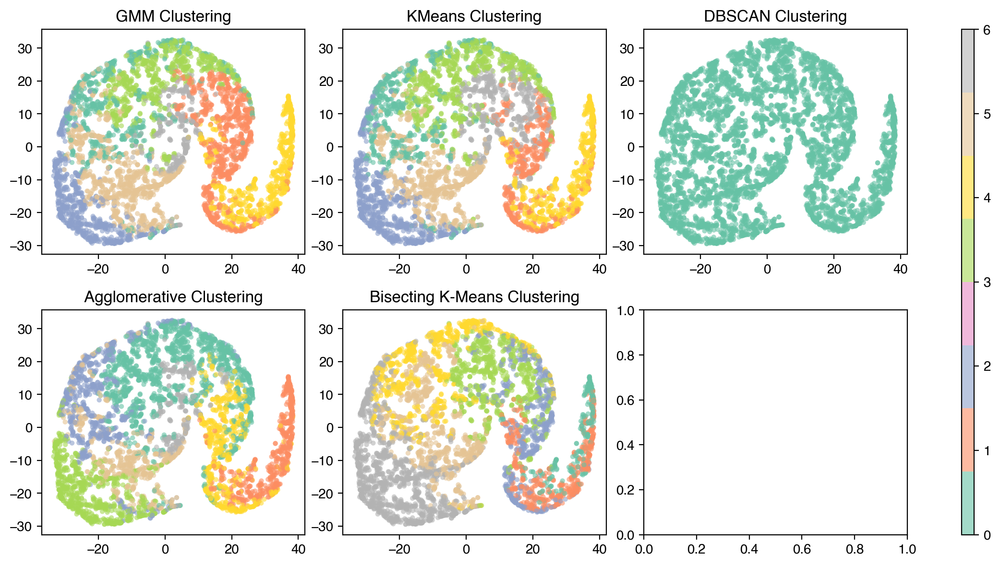

In [35]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.cluster import BisectingKMeans
from sklearn.preprocessing import StandardScaler

# 데이터 준비
# X = _df_cate[_df_cate.columns[:-1]].values
# X = tsne_df[['x', 'y']].values
# X_clst = StandardScaler().fit_transform(X_log.values)  # 스케일링 (DBSCAN 등에 적합하게 하기 위해)

n_cluster = 7
# 클러스터링 방법 설정
methods = {
    'GMM': GaussianMixture(n_components=n_cluster, covariance_type='spherical', random_state=42, init_params='k-means++'),
    'KMeans': KMeans(n_clusters=n_cluster, random_state=42, init='k-means++'),
    'DBSCAN': DBSCAN(eps=10., min_samples=n_cluster),
    'Agglomerative': AgglomerativeClustering(n_clusters=n_cluster),
    "Bisecting K-Means": BisectingKMeans(n_clusters=n_cluster),
}

# 클러스터링 결과 저장
grouped_means = {}
fig, axes = plt.subplots(2, 3, figsize=(12, 6), dpi=200)
axes = axes.flatten()

for idx, (name, model) in enumerate(methods.items()):
    # 모델 학습 및 예측
    if name == 'GMM':
        labels = model.fit(X_log).predict(X_log)
    else:
        labels = model.fit_predict(X_log)

    # 클러스터 결과를 데이터프레임에 추가
    tsne_df[f'{name}_cluster'] = labels

    # 각 클러스터의 평균값 계산
    grouped_means[name] = tsne_df.groupby(f'{name}_cluster').mean()

    # UMAP Scatter 플롯 시각화
    ax = axes[idx]
    scatter = ax.scatter(tsne_df['x'], tsne_df['y'], c=labels, cmap='Set2', s=14, alpha=0.6, edgecolor="none")
    ax.set_title(f"{name} Clustering")

plt.tight_layout()
plt.colorbar(scatter, ax=axes, location='right', aspect=40)
plt.show()

# Ref

/tmp/ipykernel_6508/1245865989.py:99: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


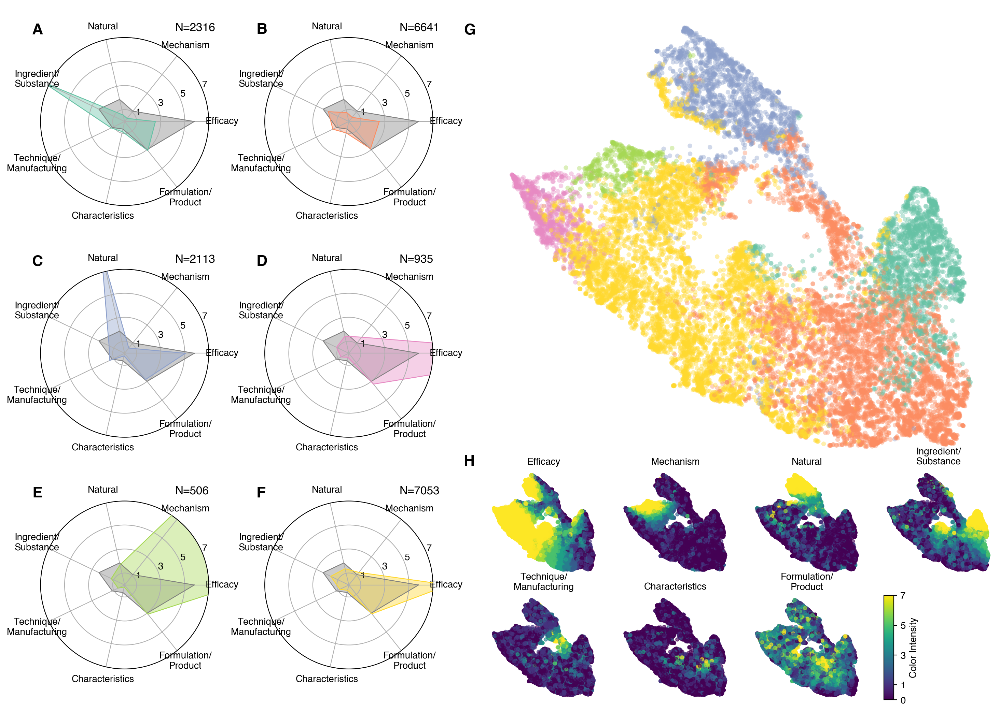

In [491]:
N_COL = 3
N_ROW = 4
X_SIZE = 6
Y_SIZE = 4.4
DPI = 200

n_clusters = 6
_clst = "cluster"
labels = labels = fcluster(linkage_matrix, t=n_clusters, criterion='maxclust')
_df_cate[_clst] = labels

cluster_means = _df_cate.groupby(_clst).mean()[cols]

# 색상 팔레트 생성 (Set2 팔레트 사용)
palette = sns.color_palette("Set2", n_colors=len(cluster_means.index))
color_map = {cluster: palette[idx] for idx, cluster in enumerate(cluster_means.index)}

# Polar와 Scatter 색상을 동일하게 설정
fig = plt.figure(figsize=(X_SIZE * N_COL, Y_SIZE * N_ROW), dpi=DPI)
spec = gridspec.GridSpec(ncols=N_COL, nrows=N_ROW, figure=fig, hspace=.01, wspace=.2, width_ratios=[1, 1, 3.])
axes = []

gmean = _df_cate.mean()[cols]
gv = gmean.tolist()
gv += gv[:1]
clst_size = _df_cate.groupby(_clst).count()['year']

# Polar 플롯
for idx, cluster in enumerate(cluster_means.index):
    ax = fig.add_subplot(spec[idx // 2, idx % 2], projection='polar')  # row, col
    ax.text(-.05, 1.02, '%s' % (string.ascii_uppercase[idx]), transform=ax.transAxes, size=16, weight='bold')
    ax.text(.8, 1.04, f'N={clst_size[cluster]}', transform=ax.transAxes, size=12)
    
    values = cluster_means.loc[cluster,cols].tolist()
    values += values[:1]  # 다각형 닫기

    # Global Average
    ax.plot(angles, gv, label=f"Global Ave.", color="grey", linewidth=.8)
    ax.fill(angles, gv, alpha=0.4, color="grey")

    # Cluster-specific color
    ax.plot(angles, values, label=f"Cluster {cluster}", color=color_map[cluster], linewidth=.8, zorder=20)
    ax.fill(angles, values, alpha=0.4, color=color_map[cluster])

    # 축과 라벨 설정
    ax.set_yticks([1, 3, 5, 7])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(cols, zorder=10)
    ax.set_ylim(0, 7)
    plt.grid(zorder=0)

# Scatter 플롯
axi = 6
ax = fig.add_subplot(spec[:2, 2])  # row, col
ax.text(-.05, .94, '%s' % (string.ascii_uppercase[axi]), transform=ax.transAxes, size=16, weight='bold')

# Scatter plot에 클러스터 색상 적용
umap_df['cluster'] = labels
plt.scatter(umap_df[0], umap_df[1], c=umap_df['cluster'].map(color_map), s=24, alpha=.4, edgecolor="none")
ax.set_axis_off()  # 축과 눈금 제거
# plt.title("UMAP Scatter Plot")


axi = 7
ax = fig.add_subplot(spec[2, 2])  # row, col
ax.text(-.05, 1.02, '%s' % (string.ascii_uppercase[axi]), transform=ax.transAxes, size=16, weight='bold')
ax.set_axis_off()  # 축과 눈금 제거
spec2 = spec[2, 2].subgridspec(nrows=2, ncols=4, wspace=0.2, hspace=.2)


for idx, feature in enumerate(cols):
    sax = fig.add_subplot(spec2[idx // 4, idx % 4])  # row, col
    scatter = sax.scatter(umap_df.loc[:, 0], umap_df.loc[:, 1], c=data[feature], cmap='viridis', alpha=0.6, vmin=0, vmax=7, s=12)
    sax.set_title(f"{feature}", fontsize=10)
    sax.set_xlabel('UMAP Dim 1', fontsize=8)
    sax.set_ylabel('UMAP Dim 2', fontsize=8)

    sax.set_axis_off()  # 축과 눈금 제거

divide_ax = spec2[1, 3].subgridspec(nrows=1, ncols=2, width_ratios=[.1, .9])
cbar_ax = fig.add_subplot(divide_ax[0, 0])  # 2번째 행, 4번째 열 위치 지정

# Scatter와 동일한 컬러맵과 범위를 사용하지만 alpha를 제거한 컬러바 생성
import matplotlib as mpl

norm = mpl.colors.Normalize(vmin=0, vmax=7)
sm = mpl.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])  # ScalarMappable에 데이터 없이 색상 범위만 설정

# 컬러바 추가
cbar = fig.colorbar(
    sm, 
    cax=cbar_ax,  # 컬러바 축 지정
    orientation='vertical',  # 컬러바 방향
)
cbar_ax.set_yticks([0, 1, 3, 5, 7])
cbar.set_label('Color Intensity', fontsize=10)

plt.tight_layout()
plt.show()

# cbar = fig.colorbar(
#     scatter, 
#     cax=cbar_ax,  # 컬러바 축 지정
#     orientation='vertical',  # 컬러바 방향
#     shrink=0.1,  # 컬러바 길이 축소
#     aspect=.2   # 컬러바 두께 조정 (값이 클수록 얇아짐)
# )

# cbar_ax.set_yticks([0, 1, 3, 5, 7])
# cbar.set_label('Color Intensity', fontsize=10)
# plt.tight_layout()
# plt.show()